<a href="https://colab.research.google.com/github/tanish1403/Analyzing-Historical-Stock-Revenue-Data-and-Building-a-Dashboard/blob/main/ModeX_tumor_fpm.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
! pip install -q kaggle
!pip install tensorflow_addons

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 611.8/611.8 kB 13.4 MB/s eta 0:00:00


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# /content/drive/MyDrive/dl/kaggle.json
! mkdir ~/.kaggle
! cp /content/drive/MyDrive/modex_training/kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d skszod/resized-liver-tumor
!unzip /content/resized-liver-tumor.zip -d resized_images

100% 2.98G/2.98G [02:19<00:00, 23.1MB/s]
100% 2.98G/2.98G [02:19<00:00, 23.0MB/s]
Archive:  /content/resized-liver-tumor.zip
  inflating: resized_images/resized_save/seg/segmentation-0.nii  
  inflating: resized_images/resized_save/seg/segmentation-1.nii  
  inflating: resized_images/resized_save/seg/segmentation-10.nii  
  inflating: resized_images/resized_save/seg/segmentation-100.nii  
  inflating: resized_images/resized_save/seg/segmentation-101.nii  
  inflating: resized_images/resized_save/seg/segmentation-102.nii  
  inflating: resized_images/resized_save/seg/segmentation-103.nii  
  inflating: resized_images/resized_save/seg/segmentation-104.nii  
  inflating: resized_images/resized_save/seg/segmentation-105.nii  
  inflating: resized_images/resized_save/seg/segmentation-106.nii  
  inflating: resized_images/resized_save/seg/segmentation-107.nii  
  inflating: resized_images/resized_save/seg/segmentation-108.nii  
  inflating: resized_images/resized_save/seg/segmentation-109.ni

In [ ]:
#  !pip install tensorflow_addons
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, TensorBoard
import tensorflow as tf
import tensorflow.keras as keras
from keras.layers import Input, Conv3D, Multiply,MaxPooling3D, UpSampling3D, Activation, BatchNormalization, PReLU, Conv2DTranspose, Attention, Softmax, concatenate, Attention, SpatialDropout3D
from keras.models import Model
# import tensorflow_addons as tfa
from tensorflow_addons.layers import InstanceNormalization
from keras import backend as K
import keras
import numpy as np  # linear algebra
import os
import random
from tensorflow.keras.losses import BinaryCrossentropy
from datetime import date
import nibabel as nib

K.set_image_data_format("channels_first")
from keras.layers import concatenate
import pandas as pd
from sklearn.model_selection import train_test_split

from scipy.spatial.distance import directed_hausdorff
from scipy import ndimage

/usr/local/lib/python3.10/dist-packages/tensorflow_addons/utils/tfa_eol_msg.py:23: UserWarning: 

TensorFlow Addons (TFA) has ended development and introduction of new features.
TFA has entered a minimal maintenance and release mode until a planned end of life in May 2024.
Please modify downstream libraries to take dependencies from other repositories in our TensorFlow community (e.g. Keras, Keras-CV, and Keras-NLP). 

For more information see: https://github.com/tensorflow/addons/issues/2807 

  warnings.warn(


In [ ]:

today = date.today()
time = today.strftime("%b-%d-%Y")

data_dir = "/content/resized_images/resized_save"
BATCH_SIZE = 4
num_epochs = 100
from datetime import datetime

# Get the current date and time
now = datetime.now()

# Format the date as 'Month-Day-Year'
date_str = now.strftime("%b-%d-%Y")

# Format the time as 'hh_mm_ss'
time_str = now.strftime("%H_%M_%S")

# Create the model directory string
model_dir = f'/content/drive/MyDrive/modeX/model_tumor_new_{date_str}_{str(num_epochs)}_epoch_{time_str}'
print(model_dir)

/content/drive/MyDrive/modeX/model_tumor_new_Feb-25-2024_100_epoch_17_06_50


In [ ]:

def MFPN_3D(inp_main, p): # where p helpr for naming the layer as we call it multiple times
    # The shape of the input feature map
    # Apply a 1x1x1 convolution
    # 1024
    inp_aux = Conv3D(int(inp_main.shape[1]/2), (1, 1, 1), padding="same", use_bias=False, name = f"feature_layer1_{p}_conv1")(inp_main) # 1024

    inputs = inp_aux
    input_shape = inputs.shape[1] # batch, channel , height , width , depth
    print(input_shape)

    y2_conv = Conv3D(input_shape, (1, 1, 1), padding="same", use_bias=False, name = f"feature_layer2_{p}_conv1")(inputs)
    y2_batch = BatchNormalization( axis=1,name = f"feature_layer2_{p}_batch1")(y2_conv)
    y2 = Activation("selu", name = f"feature_layer2_{p}_relu1")(y2_batch) # 1024

    y3_input = concatenate([inputs, y2_batch],axis=1,name = f"feature_layer3_{p}_concat1") # 2048
    y3_conv = Conv3D(input_shape, (3, 3, 3), padding="same", dilation_rate=(4,4,4), use_bias=False, name = f"feature_layer3_{p}_conv1")(y3_input) # 1024
    y3_batch = BatchNormalization( axis=1,name = f"feature_layer3_{p}_batch1")(y3_conv)
    y3 = Activation("selu", name = f"feature_layer3_{p}_relu1")(y3_batch)

    y4_input = concatenate([inputs, y3_batch], axis=1,name = f"feature_layer4_{p}_concat1")
    y4_conv = Conv3D(input_shape, (3, 3, 3), padding="same", dilation_rate=(8,8,8), use_bias=False, name = f"feature_layer4_{p}_conv1")(y4_input)
    y4_batch = BatchNormalization( axis=1,name = f"feature_layer4_{p}_batch1")(y4_conv)
    y4 = Activation("selu", name = f"feature_layer4_{p}_relu1")(y4_batch)

    # Concatenate all the feature maps
    y = concatenate([y2, y3], axis=1, name = f"feature_concat_1_2_{p}")
    y = Conv3D(input_shape, (1, 1, 1), padding="same", use_bias=False, name = f"feature_final_conv0_{p}")(y)
    y = BatchNormalization( axis=1,name = f"feature_final_batch0_{p}")(y)
    y = concatenate([y, y4], axis=1, name = f"feature_concat__1_2_3{p}")

    # Apply a final 1x1x1 convolution
    y = Conv3D(input_shape, (1, 1, 1), padding="same", use_bias=False, name = f"feature_final_conv1_{p}")(y)
    y = BatchNormalization( axis=1,name = f"feature_final_batch1_{p}")(y)
    y = Activation("selu", name = f"feature_final_relu1_{p}")(y)

    # Optionally you can add a final 3x3x3 convolution here
    y = Conv3D(input_shape, (3, 3, 3), padding="same", use_bias=False, name = f"feature_final_conv2_{p}")(y)
    y = InstanceNormalization( axis=1,name = f"feature_final_batch2_{p}")(y)
    y = SpatialDropout3D(0.2, name = f"feature_final_dropout2_{p}")(y)
    final_output = Activation("selu", name = f"feature_final_relu2_{p}")(y)

    return final_output


In [ ]:



def create_convolution_block(input_layer, n_filters, batch_normalization=True, kernel=(3, 3, 3), activation=None,
                             padding='same', strides=(1, 1, 1), layer_depth=None):
    """

    :param strides:
    :param input_layer:
    :param n_filters:
    :param batch_normalization:
    :param kernel:
    :param activation: Keras activation layer to use. (default is 'relu')
    :param padding:
    :return:
    """
    layer = Conv3D(n_filters, kernel, padding=padding, strides=strides,
                   name="depth_"+str(layer_depth)+"_conv")(input_layer)
    if batch_normalization:
        layer = BatchNormalization(
            axis=1, name="depth_"+str(layer_depth)+"_bn")(layer)
    if activation is None:
        return Activation('selu', name="depth_"+str(layer_depth)+"_relu")(layer)
    else:
        return activation()(layer)


def create_dilation_block(input_layer, n_filters, kernel=(3, 3, 3),
                          padding='same', strides=(1, 1, 1), layer_depth=None, dilation=(2,2,2)):
    layer_conv = Conv3D(n_filters, kernel, padding=padding, strides=strides,
                        name="depth_"+str(layer_depth)+"_conv_non_dil")(input_layer)
    layer_dil = Conv3D(n_filters, kernel, padding=padding, strides=strides, dilation_rate=dilation,
                       name="depth_"+str(layer_depth)+"_conv_with_dil")(input_layer)
    concat = concatenate([layer_conv, layer_dil], axis=1)
    batch_norm = BatchNormalization(axis=1, name="depth_"+str(layer_depth)+"_bn_dilated")(concat)
    return Activation('selu', name="depth_"+str(layer_depth)+"_relu_with_dil")(batch_norm)


In [ ]:

input_shape= (1, 128, 128, 64)
output_shape =(2, 128, 128, 64)
num_classes=2
n_base_filters = 32
inputs = Input(input_shape)
pool_size = (2, 2, 2)

layer1 = create_convolution_block(
    input_layer=inputs, n_filters=n_base_filters*(2**0), layer_depth=0)
layer2 = create_dilation_block(
    input_layer=layer1, n_filters=n_base_filters*(2**0)*2, layer_depth=1)

maxPool1 = MaxPooling3D(pool_size=pool_size)(layer2)
#  new layer
# layer_rought_conv_0 = Conv3D(128, (1, 1, 1))(maxPool1)


layer3 = create_convolution_block(input_layer=maxPool1, n_filters=n_base_filters*(2**1),
                                  layer_depth=2)
layer4 = create_dilation_block(input_layer=layer3, n_filters=n_base_filters*(2**1)*2,
                                  layer_depth=3)



maxPool2 = MaxPooling3D(pool_size=pool_size)(layer4)

#  new layer
# layer_rought_conv_1 = Conv3D(256, (1, 1, 1))(maxPool2)


layer5 = create_convolution_block(input_layer=maxPool2, n_filters=n_base_filters*(2**2),
                                  layer_depth=4)
layer6 = create_dilation_block(input_layer=layer5, n_filters=n_base_filters*(2**2)*2,
                                  layer_depth=5)

maxPool3 = MaxPooling3D(pool_size=pool_size)(layer6)
layer7 = create_convolution_block(input_layer=maxPool3, n_filters=n_base_filters*(2**3),
                                  layer_depth=6)
layer8 = create_dilation_block(input_layer=layer7, n_filters=n_base_filters*(2**3)*2,
                                  layer_depth=7)
FPM_base = MFPN_3D(layer8,"base")

upSample1 = UpSampling3D(size=pool_size)(FPM_base)


# layer2 = MFPN_3D(layer2, 2)
# FPM_layer4 = MFPN_3D(layer4, 4)
# FPM_layer6 = MFPN_3D(layer6, 6)
# pool_FPM4 = MaxPooling3D(pool_size=pool_size, name = "Maxpool_FPM4")(FPM_layer4)
# pool_layer2 = Conv3D((layer2.shape[1])*2, kernel_size=(3, 3, 3), padding="same", strides=(1, 1, 1),name="Conv3D_L2")(layer2)
# pool_layer2 = MaxPooling3D(pool_size=pool_size, name = "Maxpool_L2")(pool_layer2)

# concat_2_4 = concatenate([layer4, pool_layer2],name ="Concate_2_4",  axis=1)
# conv_FPN_2_4 = Conv3D((concat_2_4.shape[1])*4, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="Conv_2_4")(concat_2_4)
# pool_2_4 = MaxPooling3D(pool_size=pool_size, name = "Maxpool_2_4")(conv_FPN_2_4)

# concat_2_4_6 = concatenate([layer6, pool_2_4], name ="Concate_2_4_6", axis=1)

# concat1 = concatenate([ upSample1,concat_2_4_6], axis=1)
concat1 = concatenate([ upSample1,layer6], axis=1)

layer9 = create_convolution_block(
    input_layer=concat1, n_filters=layer6.shape[1], layer_depth=8)


layer10 = create_convolution_block(
    input_layer= layer9, n_filters=layer6.shape[1], layer_depth=9)

# attention_0 = Attention()([layer_rought_conv_1, layer10])
# sample_layer10 = create_convolution_block(
    # input_layer= attention_0, n_filters=layer6.shape[1], la/yer_depth="sample_10")

upSample2 = UpSampling3D(size=pool_size)(layer10)

upSample2 = Conv3D(upSample2.shape[1]//2, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="conv_upsample_2")(upSample2)

# concat2 = concatenate([upSample2, concat_2_4], axis=1)
concat2 = concatenate([upSample2, layer4], axis=1)


layer11 = create_convolution_block(
    input_layer=concat2, n_filters=layer4.shape[1], layer_depth=10)



layer12 = create_convolution_block(
    input_layer=layer11, n_filters=layer4.shape[1], layer_depth=11)

# attention_1 = Attention()([layer_rought_conv_0, layer12])
# sample_layer12 = create_convolution_block(
#     input_layer=attention_1, n_filters=layer4.shape[1], layer_depth="Sample_12")
layer12 = Conv3D(layer12.shape[1]//8, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="layer12_outer_conv_1")(layer12)
upSample3 = UpSampling3D(size=pool_size)(layer12)

# concat3 = concatenate([upSample3, layer2], axis=1)
layer2 = Conv3D(layer2.shape[1]//4, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="layer2_outer_conv_1")(layer2)

concat3 = concatenate([upSample3, layer2], axis=1)

layer13 = create_convolution_block(
    input_layer=concat3, n_filters=layer2.shape[1], layer_depth=12)




# FPM_up1 = MFPN_3D(upSample1, 2)


# applying dilation for outer layer
Dil_up1 = create_dilation_block(
    input_layer=upSample1, n_filters=upSample1.shape[1]//4, layer_depth="outer1")
Dil_up1 = Conv3D(Dil_up1.shape[1]//4, kernel_size=(1,1,1), strides=(1,1,1), padding="same",)(Dil_up1)
upSample_FPM_up1 = UpSampling3D(size=(4,4,4), name = "Outer_dilation_1_upsample")(Dil_up1)
# upSample_FPM_up1 = Conv3D(upSample_FPM_up1, kernel_size=(1,1,1), stride=(1,1,1), padding="same")(upSample_FPM_up1)

# reducing upSample_FPM_up1 and layer to 1/2 and then put attention and then concat
layer2 = Conv3D(layer2.shape[1]//4, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="layer2_outer_conv")(layer2)
upSample_FPM_up1_conv = Conv3D(layer2.shape[1], kernel_size=(3,3,3), strides=(1,1,1), padding="same", name="upSample_FPM_up1_conv")(upSample_FPM_up1)

print("att 1")
upSample_FPM_up1_attention = Attention(name="Attetion_1")([upSample_FPM_up1_conv, layer2])
upSample_FPM_up1 = concatenate([upSample_FPM_up1, upSample_FPM_up1_attention], axis=1)


# FPM_up2 = MFPN_3D(upSample2, 3)

# applying dilation for outer layer 2nd
upSample2_shorten =  Conv3D(upSample2.shape[1]//4, kernel_size=(3,3,3), strides=(1,1,1), padding="same", name="upSample_2_conv_bef_dil")(upSample2)
Dil_up2 = create_dilation_block(
    input_layer=upSample2_shorten, n_filters=upSample2.shape[1], layer_depth="outer2")
Dil_up2 = Conv3D(Dil_up2.shape[1]//8, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="outer2_Diluted_up_conv")(Dil_up2)
upSample_FPM_up2 = UpSampling3D(size=pool_size, name = "Outer_dilation_2_upsample")(Dil_up2)

# reducing upSample_FPM_up2 and layer to 1/2 and then put attention and then concat
upSample_FPM_up2_conv = Conv3D(layer2.shape[1]//2, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="upSample_FPM_up2_conv")(upSample_FPM_up2)
layer2 = Conv3D(layer2.shape[1]//2, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="layer2_outer_conv2")(upSample_FPM_up1)
upSample_FPM_up2 = Conv3D(upSample_FPM_up2.shape[1]//4, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="upSample_FPM_up2_conv_extra")(upSample_FPM_up2)
print("atten 2")
upSample_FPM_up2_attention = Attention(name="Attention_2")([upSample_FPM_up2_conv, layer2])
upSample_FPM_up2 = concatenate([upSample_FPM_up2, upSample_FPM_up2_attention], axis=1)

upSample_FPM_up1 = Conv3D(upSample_FPM_up1.shape[1]/4, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="upSample_FPM_up1_conv1")(upSample_FPM_up1)
upSample_FPM_up2 = Conv3D(upSample_FPM_up2.shape[1]/4, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="upSample_FPM_up2_conv1")(upSample_FPM_up2)

final_concat_1 = concatenate([upSample_FPM_up1, upSample_FPM_up2], axis=1)
final_concat1_conv = Conv3D(layer13.shape[1]/2, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="final_concat1")(final_concat_1)
final_concat1_conv = BatchNormalization(axis=1)(final_concat1_conv)


layer13 = Conv3D(layer13.shape[1]//2, kernel_size=(1,1,1), strides=(1,1,1), padding="same",name ="layer13_conv")(layer13)
final_concat = concatenate([final_concat1_conv, layer13], axis=1)
layer14 = create_convolution_block(
    input_layer=final_concat, n_filters=32, layer_depth=13)
layer14 = Conv3D(layer14.shape[1]//2, kernel_size=(1,1,1), strides=(1,1,1), padding="same", name="layer14_outer_conv_1")(layer14)

layer15 = create_convolution_block(
    input_layer=layer14, n_filters=16, layer_depth=13)

final = Conv3D(filters=num_classes,kernel_size=(1,1,1))(layer14)
act = Activation("sigmoid")(final)


512
att 1
atten 2


In [ ]:
#Metrices
def mean_iou(y_true, y_pred):
    # Flatten the tensors to 1D arrays
    y_true_flat = K.flatten(y_true)
    y_pred_flat = K.flatten(y_pred)

    # Calculate the intersection and union
    intersection = K.sum(y_true_flat * y_pred_flat)
    union = K.sum(K.maximum(y_true_flat, y_pred_flat))

    # Calculate the IoU (Jaccard Index)
    iou = intersection / (union + K.epsilon())

    return iou

import tensorflow as tf

def precision(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    return (intersection + 1e-15) / (tf.reduce_sum(y_pred) + 1e-15)

def recall(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    return (intersection + 1e-15) / (tf.reduce_sum(y_true) + 1e-15)

def F2(y_true, y_pred, beta=2):
    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    return (1 + beta**2) * (p * r) / (beta**2 * p + r + 1e-15)

def dice_score(y_true, y_pred):
    return (2 * tf.reduce_sum(y_true * y_pred) + 1e-15) / (tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) + 1e-15)

def jac_score(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred)
    union = tf.reduce_sum(y_true) + tf.reduce_sum(y_pred) - intersection
    return (intersection + 1e-15) / (union + 1e-15)

## https://www.kaggle.com/competitions/uw-madison-gi-tract-image-segmentation/discussion/319452
def hausdorff_distance(A, B):
    """
    Compute the Hausdorff Distance between two point sets A and B in TensorFlow.
    The Hausdorff Distance is the maximum distance of a set to the nearest point in the other set.
    """
    # Expand dims to apply broadcasting.
    A_expanded = tf.expand_dims(A, 2)
    B_expanded = tf.expand_dims(B, 1)

    # Compute pairwise distances between points in A and B.
    distances = tf.sqrt(tf.reduce_sum(tf.square(A_expanded - B_expanded), axis=-1))

    # Find the shortest distance from each point in A to B, and vice versa.
    min_dist_A_to_B = tf.reduce_min(distances, axis=1)
    min_dist_B_to_A = tf.reduce_min(distances, axis=0)

    # Compute the directed Hausdorff distances.
    hausdorff_A_to_B = tf.reduce_max(min_dist_A_to_B)
    hausdorff_B_to_A = tf.reduce_max(min_dist_B_to_A)

    # The Hausdorff distance is the maximum of these two directed distances.
    hausdorff_distance = tf.maximum(hausdorff_A_to_B, hausdorff_B_to_A)

    return hausdorff_distance
matrics = [jac_score,hausdorff_distance,dice_score,F2,recall,precision,"MAE","MSE"]

# def dice_coef(y_true, y_pred, axis=(0, 1, 2, 3), smooth=10e-6):
#     """
#     Dice = (2*|X & Y|)/ (|X|+ |Y|)
#          =  2*sum(|A*B|)/(sum(A^2)+sum(B^2))
#     ref: https://arxiv.org/pdf/1606.04797v1.pdf
#     """
#     intersection = K.sum(K.abs(y_true * y_pred), axis=axis)
#     return (2. * intersection + smooth) / (K.sum(K.square(y_true), axis) + K.sum(K.square(y_pred), axis) + smooth)

def weighted_dice_loss(targets, inputs, smooth=1e-6, weight_factor=0.5):
    # Sigmoid activation to convert logits to probabilities
    inputs = tf.sigmoid(inputs)

    # Flatten the tensors
    inputs = tf.reshape(inputs, [-1])
    targets = tf.reshape(targets, [-1])

    # Compute weights: More weight on the positive class (tumor) regions
    weights = targets * weight_factor + 1.0

    # Compute weighted intersection and union
    intersection = tf.reduce_sum(weights * inputs * targets)
    total = tf.reduce_sum(weights * inputs) + tf.reduce_sum(weights * targets)

    # Compute weighted Dice coefficient
    dice = (2. * intersection + smooth) / (total + smooth)

    # Return weighted Dice loss
    return 1 - dice




In [ ]:
## train test spilt

# Create lists to hold file paths
volumes = [f"{data_dir}/vol/volume-{i}.nii" for i in range(130)]
masks = [f"{data_dir}/seg/segmentation-{i}.nii" for i in range(130)]

# Create a DataFrame
df = pd.DataFrame({
    'volume': volumes,
    'mask': masks
})

# Split the DataFrame
train_df, test_val_df = train_test_split(df, test_size=0.3, random_state=42)
val_df, test_df = train_test_split(test_val_df, test_size=0.5, random_state=42)



In [ ]:

# import tensorflow as tf

# since we have a lot of data, we will use a generator to load the data in batches
# prepare your own data
# X, y = data_loder()
# where X is the volume and y is the mask

# now we will wrtie the data_loader function

def resize(vol, order):
    x = 128/vol.shape[0]
    y = 128/vol.shape[1]
    resize_factor = [x, y, 1]
    return ndimage.zoom(vol, resize_factor, order=order)

def one_hot_encode(mask, num_classes=3):
    # Assumes mask is in the shape (height, width, depth)
    # Use Python's built-in int type
    one_hot_mask = np.zeros((*mask.shape, num_classes), dtype=int)
    # For each class, zero out the channel that doesn't correspond to that class
    for i in range(num_classes):
        # this will make the mask as one hot encoded
        one_hot_mask[mask == i, i] = 1

    return  np.transpose(one_hot_mask, (3, 0, 1, 2))


def expand_recursively(vol, mask,depth_limit=64):
    # Base case: if last dimension is greater than 64, return the arrays as they are
    if vol.shape[-1] > depth_limit:
        return vol, mask

    # Expand the volume along the last dimension
    vol_temp = np.concatenate((vol, vol), axis=-1)

    # Similarly, expand the mask along the last dimension
    mask_temp = np.concatenate((mask, mask), axis=-1)

    # Recursive call with the expanded volume and mask
    return expand_recursively(vol_temp, mask_temp,depth_limit)

def data_loader_tumor(batch_size=1, data_df:pd.DataFrame=train_df):
    """
    This function will load the data in batches
    we will use tensorflow dataset api
    we will make it something like which will for now have just the paths but will q
    """
    def generator():
        for _, row in data_df.iterrows():
            vol_file_path = row['volume']
            mask_file_path = row['mask']
            # print(f"Loading volume from {vol_file_path} and mask from {mask_file_path}")

            vol = nib.load(vol_file_path).get_fdata()
            mask = nib.load(mask_file_path).get_fdata()
            vol = resize(vol, order=3)
            mask = resize(mask, order=0)
            vol = np.clip(vol, -200, 250)
            # Expand the volume and mask recursively
            vol,mask = expand_recursively(vol, mask, depth_limit=64)

            for j in range(0, vol.shape[-1], 64):
                    if j + 64 > vol.shape[-1]:
                        start_idx = max(vol.shape[-1] - 64, 0)
                        vol_padded = vol[..., start_idx:]
                        mask_padded = mask[..., start_idx:]

                    else:
                        vol_padded = vol[..., j:j+64]
                        mask_padded = mask[..., j:j+64]

                    # assume liver as background and tumor as foreground
                    mask_padded[mask_padded == 1] = 0
                    mask_padded[mask_padded == 2] = 1
                    # One-hot encode the mask
                    mask_padded_encoded = one_hot_encode(mask_padded,2)

                    # Expand dims for volume to add a batch dimension
                    vol_padded_expanded = np.expand_dims(vol_padded, axis=0)

                    # Assuming one_hot_encode already expands or alters dimensions as needed
                    # No need to transpose if one_hot_encode outputs the correct shape, adjust if necessary
                    # print(vol_padded_expanded.shape)
                    # print(mask_padded_encoded.shape)
                    yield vol_padded_expanded, mask_padded_encoded

    # now we will create a dataset from the generator
    dataset = tf.data.Dataset.from_generator(generator, output_types=(tf.float32, tf.float32))

    # now we will shuffle the data
    # dataset = dataset.shuffle(buffer_size=130)

    # now we will batch the data
    dataset = dataset.batch(batch_size=batch_size)

    # now we will prefetch the data
    dataset = dataset.prefetch(buffer_size=3)

    return dataset

In [ ]:
train_dataset = data_loader(batch_size=BATCH_SIZE)
test_dataset = data_loader(batch_size=BATCH_SIZE, data_df=test_df)
val_dataset = data_loader(batch_size=BATCH_SIZE, data_df=val_df)

In [ ]:
model =  keras.models.Model(inputs,outputs=act)
model.load_weights("/content/drive/MyDrive/modex_training/modex_training/model_Feb-12-2024_100_epoch_18_36_07/final/weights.h5")

In [ ]:

# model =  keras.models.Model(inputs,outputs=act)
model.compile(optimizer=keras.optimizers.SGD(learning_rate=1e-3, momentum=0.9, nesterov=False),
              loss=weighted_dice_loss,
              metrics=matrics
             )

In [ ]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 1, 128, 128, 64)]    0         []                            
                                                                                                  
 depth_0_conv (Conv3D)       (None, 32, 128, 128, 64)     896       ['input_1[0][0]']             
                                                                                                  
 depth_0_bn (BatchNormaliza  (None, 32, 128, 128, 64)     128       ['depth_0_conv[0][0]']        
 tion)                                                                                            
                                                                                                  
 depth_0_relu (Activation)   (None, 32, 128, 128, 64)     0         ['depth_0_bn[0][0]']      

In [ ]:


best_model_checkpoint = ModelCheckpoint(
    filepath=f"{model_dir}/checkpoint/best_model.h5",
    save_best_only=True,
    monitor='val_loss',  # or another metric that you want to monitor
    mode='min',  # or 'max' if the metric should be maximized
    verbose=1
)

# Callback to save the model after each epoch
epoch_model_checkpoint = ModelCheckpoint(
    filepath=f"{model_dir}/checkpoint/model_epoch_" + "{epoch:02d}.h5",
    save_best_only=False,
    verbose=1
)
# early_stopping_callback = EarlyStopping(patience=patience_value)
tensorboard_callback = TensorBoard(log_dir=f"{model_dir}/logs",
                        histogram_freq=0,
                         write_graph=True,
                         write_images=True,
)


In [ ]:
# num_samples = len(list(train_dataset))
# print(num_samples)

In [ ]:
from scipy import ndimage
history = model.fit(
    train_dataset,
    validation_data=val_dataset,
    epochs=num_epochs,        # Number of training epochs

    callbacks=[best_model_checkpoint, tensorboard_callback]
)

Epoch 1/100
     73/Unknown - 255s 3s/step - loss: 0.3028 - jac_score: 0.8837 - hausdorff_distance: 8.0000 - dice_score: 0.9380 - F2: 0.9457 - recall: 0.9508 - precision: 0.9256 - MAE: 0.0629 - MSE: 0.0528
Epoch 1: val_loss improved from inf to 0.30343, saving model to /content/drive/MyDrive/modeX/model_tumor_new_Feb-25-2024_100_epoch_17_06_50/checkpoint/best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


73/73 [==============================] - 305s 3s/step - loss: 0.3028 - jac_score: 0.8837 - hausdorff_distance: 8.0000 - dice_score: 0.9380 - F2: 0.9457 - recall: 0.9508 - precision: 0.9256 - MAE: 0.0629 - MSE: 0.0528 - val_loss: 0.3034 - val_jac_score: 0.8806 - val_hausdorff_distance: 8.0000 - val_dice_score: 0.9362 - val_F2: 0.9424 - val_recall: 0.9466 - val_precision: 0.9260 - val_MAE: 0.0646 - val_MSE: 0.0576
Epoch 2/100
73/73 [==============================] - ETA: 0s - loss: 0.3001 - jac_score: 0.9090 - hausdorff_distance: 8.0000 - dice_score: 0.9522 - F2: 0.9594 - recall: 0.9642 - precision: 0.9405 - MAE: 0.0484 - MSE: 0.0398
Epoch 2: val_loss improved from 0.30343 to 0.30188, saving model to /content/drive/MyDrive/modeX/model_tumor_new_Feb-25-2024_100_epoch_17_06_50/checkpoint/best_model.h5
73/73 [==============================] - 210s 3s/step - loss: 0.3001 - jac_score: 0.9090 - hausdorff_distance: 8.0000 - dice_score: 0.9522 - F2: 0.9594 - recall: 0.9642 - precision: 0.9405 - 

KeyboardInterrupt: 

In [ ]:
# save model
model.save(f'{model_dir}/final/model.h5')
model.save_weights(f'{model_dir}/final/weights.h5')



In [ ]:
evaluation_result = model.evaluate( test_dataset)


16/16 [==============================] - 40s 2s/step - loss: 0.2983 - jac_score: 0.9235 - hausdorff_distance: 8.0000 - dice_score: 0.9599 - F2: 0.9681 - recall: 0.9737 - precision: 0.9466 - MAE: 0.0401 - MSE: 0.0333


In [ ]:
res = []
for data in test_dataset:
    input = data[0]
    label = data[1]
    prediction = model.predict(input)
    res.append({"input": input, "label": label, "prediction": prediction})

1/1 [==============================] - 0s 29ms/step


In [ ]:
import cv2 as cv
def visulaize_slice(input, label, prediction, saveDir,upper_limit=0.5):
    # where 24 is width and 24 is height
    # the depth is 64 ie last dimension
    # we will plot every 5th slice of the volume
    # so we will have 64/5 = 12 slices
    # we will show a row of 6 images
    count = 0
    for i in range(0, label.shape[-1], 5):
        mask = np.zeros(
            (input.shape[2], input.shape[3]))  # (width,height)
        mask[label[0, 1, :, :, i] == 1] = 1

        predicted_mask = np.zeros(
            (prediction.shape[2], prediction.shape[3]))  # (width,height)

        predicted_mask[prediction[0, 1, :, :, i] > upper_limit] = 1
        # only plot pic if it have mask detected
        if np.sum(predicted_mask) == 0 or np.sum(mask) == 0:
            continue
        # print(np.sum(predicted_mask))
        plt.figure(figsize=(24, 24))
        plt.subplot(3, 3, count + 1)
        count = (count+1)%6
        plt.imshow(input[0, 0, :, :, i], cmap='gray')
        plt.contour(mask, colors='blue', linewidths=1)  # liver mask
        # we will plot the predicted mask contour with dashed lines with seperatio between the dashes as 2
        plt.contour(predicted_mask, colors='red',
                    linewidths=0.5, linestyles="dashdot")  # predicted liver mask

        plt.title(f'Original Image Slice {i}')
        plt.axis('off')
        plt.show()
        # check if the directory exists
        if not os.path.exists(f'{saveDir}/images'):
            os.makedirs(f'{saveDir}/images')
        # gnerate the image name with random number
        hash = random.getrandbits(128)
        plt.savefig(f'{saveDir}/images/{upper_limit}_{hash}_{i}.png')
        plt.close()
        try:
            # making another directory name image2
            if not os.path.exists(f'{saveDir}/images2'):
                os.makedirs(f'{saveDir}/images2')
            # save the original image
            cv.imwrite(f'{saveDir}/images2/{upper_limit}_{hash}_{i}.png', input[0, 0, :, :, i])
        except:
            continue

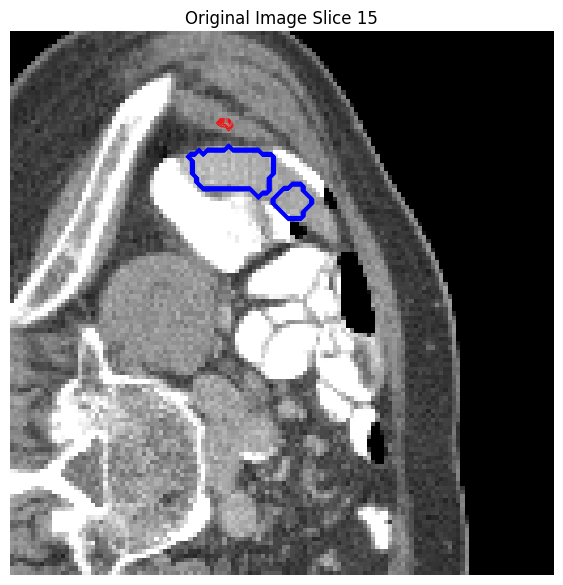

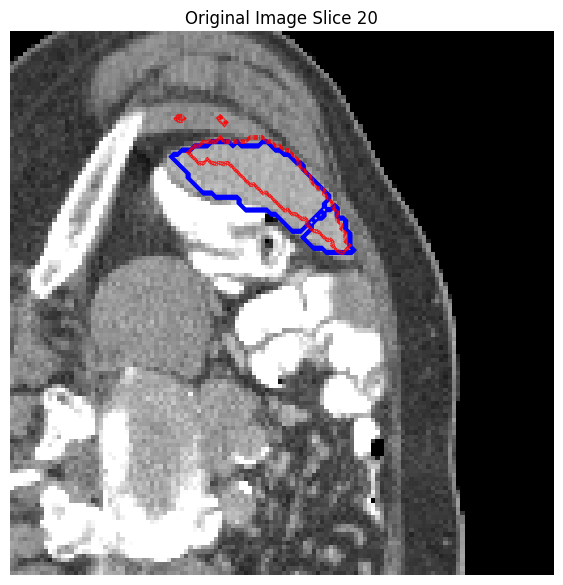

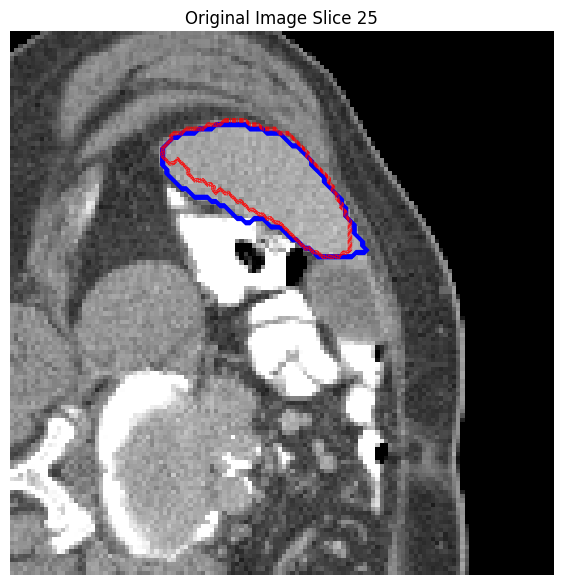

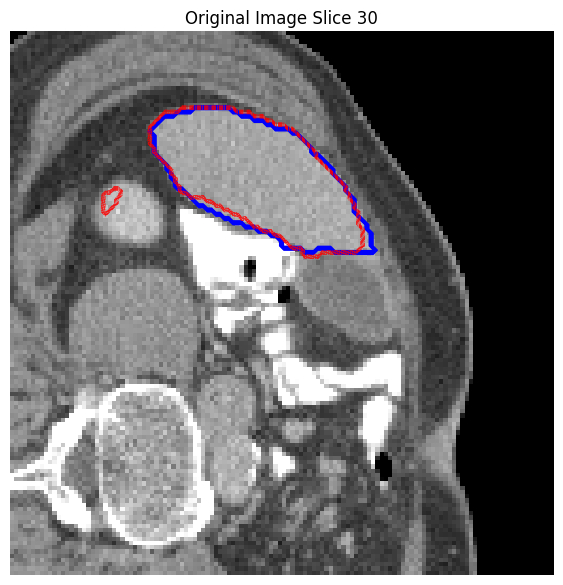

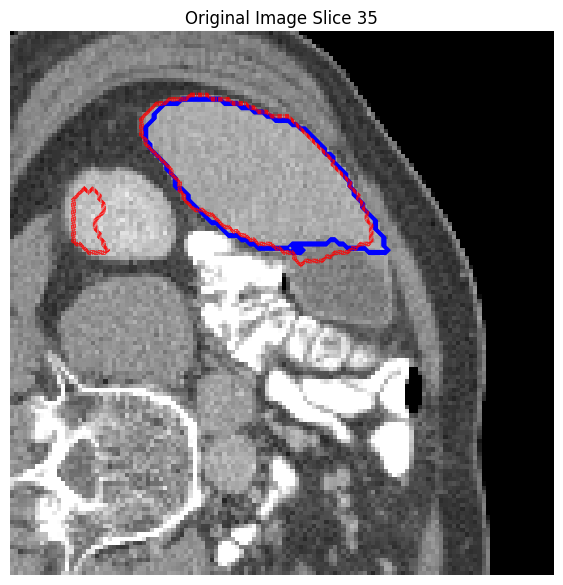

...

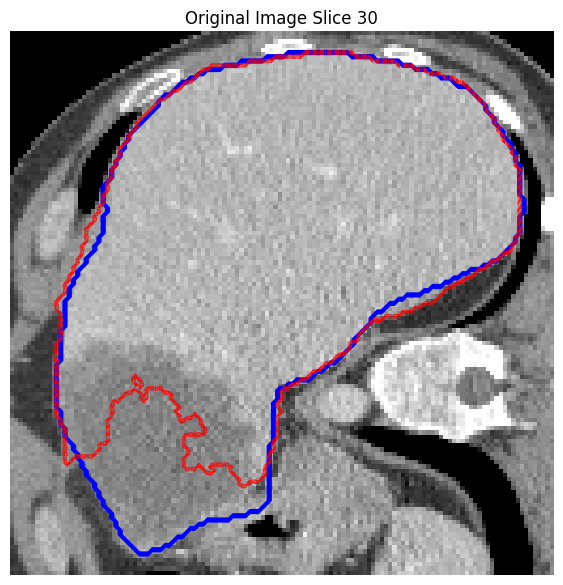

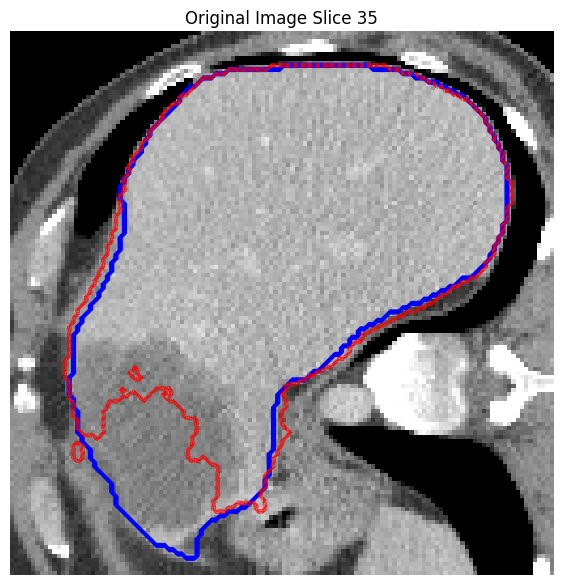

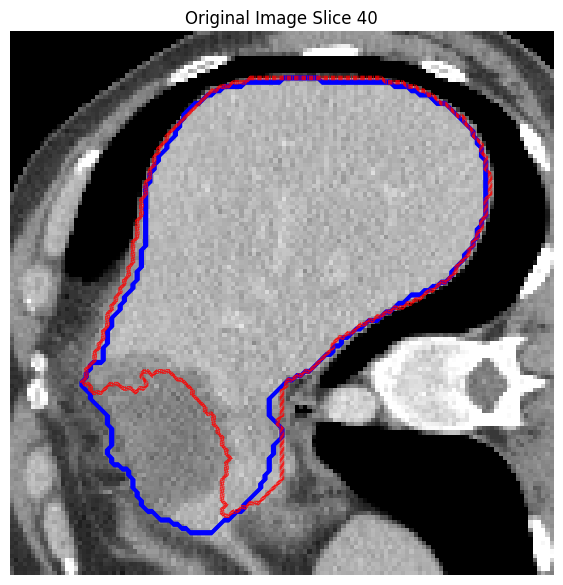

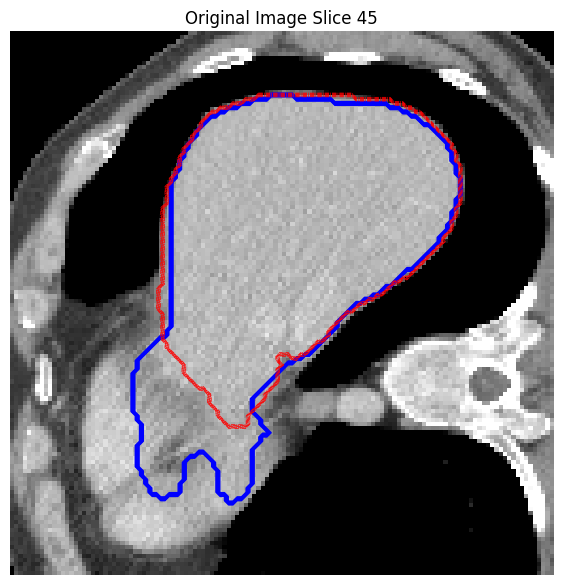

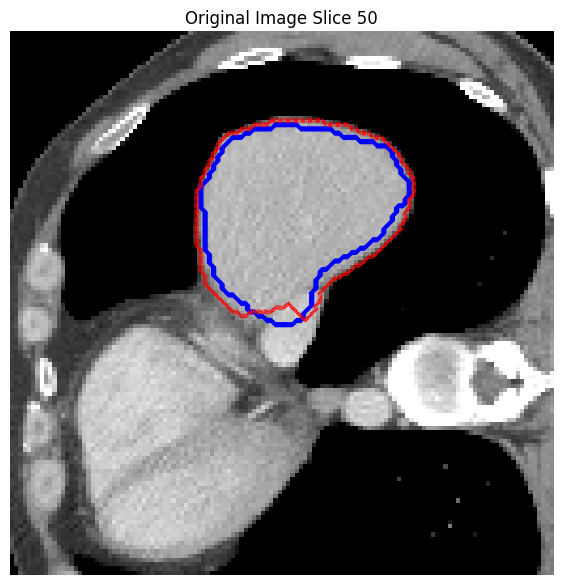

In [ ]:

for _ in res:
    visulaize_slice(_["input"], _["label"], _["prediction"],model_dir,0.5)

In [ ]:
# for _ in res:
#     visulaize_slice(_["input"], _["label"], _["prediction"],model_dir,0.2)

In [ ]:
# from google.colab import runtime
# runtime.unassign()

In [ ]:
! cp -r /content/modex_training /content/drive/MyDrive/modex_training

cp: cannot stat '/content/modex_training': No such file or directory


In [ ]:
!zip -r output.zip /content/modex_training/

	zip warning: name not matched: /content/modex_training/

zip error: Nothing to do! (try: zip -r output.zip . -i /content/modex_training/)


In [ ]:
from google.colab import files
files.download('output.zip')

FileNotFoundError: Cannot find file: output.zip